# Dev/test INR

In [1]:
%load_ext autoreload
%autoreload 2 

In [2]:
from pathlib import Path

import numpy as np
import torch

import quantem as em
from quantem.core import config
from quantem.core.datastructures import Dataset4dstem
from quantem.core.ml import CNN2d, OptimizerParams, SchedulerParams
from quantem.core.visualization import show_2d
from quantem.diffractive_imaging import (
    DetectorPixelated,
    ObjectDIP,
    ObjectINR,
    ObjectPixelated,
    ProbeDIP,
    ProbePixelated,
    Ptychography,
    PtychographyDatasetRaster,
)

print(f"quantEM version: {em.__version__}")

GPU_ID = 2
config.set_device(GPU_ID)
print(f"Using GPU {config.get('device')}")

/home/amccray/code/quantem/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


quantEM version: 0.1.8
Using GPU cuda:2


In [3]:
filepath = Path("../../data/ducky_251105_20mrad_500A-df_4A-step_5e+04-dose_clean.zip")
dset: Dataset4dstem = em.io.load(filepath)
print(dset)

PROBE_ENERGY = 80e3 # eV, accelerating voltage
PROBE_SEMIANGLE = 20 # mrad, convergence semiangle
PROBE_DEFOCUS = 500 # A, probe defocus

quantem Dataset named 'ducky_251105_clean'
  shape: (37, 37, 200, 200)
  dtype: float32
  device: cpu
  origin: [0. 0. 0. 0.]
  sampling: [4.    4.    0.025 0.025]
  units: ['A', 'A', 'A^-1', 'A^-1']
  signal units: 'arb. units'


(<Figure size 400x400 with 1 Axes>,
 <Axes: title={'center': 'good recon (for reference)'}>)

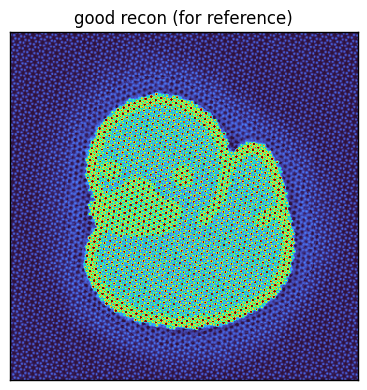

In [4]:
good_recon = np.load("../../data/near_optimal_ducky_phase_cropped.npy")
show_2d(good_recon.sum(0), cmap='turbo', title='good recon (for reference)')

(<Figure size 400x400 with 1 Axes>,
 <Axes: title={'center': 'ducky_251105_clean_dp_mean'}>)

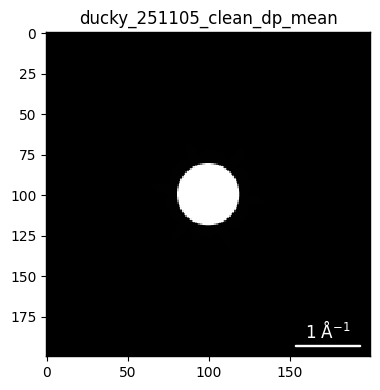

In [5]:
dset.dp_mean.show(show_ticks=True)

In [6]:
# Binning in reciprocal space is limited here because the probe support must still fit.
# Optional example (not used):
# dset_small = dset.bin((1,1,2,2), modify_in_place=False)

## Pixelated ptychography
First we run a standard pixelated reconstruction to establish a baseline before moving to DIP.

Calculated best fit rotation = 0 degrees.


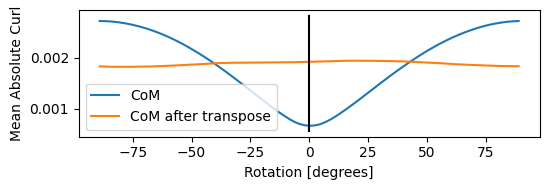

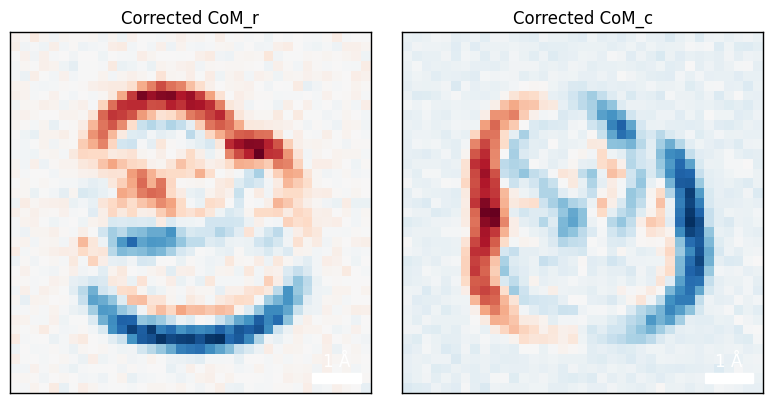

Normalizing intensities: 100%|██████████| 1369/1369 [00:01<00:00, 820.37probe position/s]


In [7]:
pdset = PtychographyDatasetRaster.from_dataset4dstem(dset)
pdset.preprocess(
    com_fit_function="constant",
    plot_rotation=True,
    plot_com=True,
)

obj_model_pix = ObjectPixelated.from_uniform( # Alternatives include from_array and from_random.
    obj_type="pure_phase",
    num_slices=1,
)

probe_params = {
    "energy": PROBE_ENERGY,
    "defocus": PROBE_DEFOCUS,
    "semiangle_cutoff": PROBE_SEMIANGLE,
}
probe_model_pix = ProbePixelated.from_params(
    probe_params=probe_params,
)

detector_model = DetectorPixelated()

In [8]:
# Optional: enable TensorBoard logging while iterating on settings.
from quantem.diffractive_imaging.logger_ptychography import LoggerPtychography

logger_pix = None
# logger_pix = LoggerPtychography(
#     log_dir = "./logs",
#     run_prefix=dset.name,
#     run_suffix="pix",
#     log_images_every=10,
#     log_probe_images=False,
# )

After the sub-models are ready, we combine them into a `Ptychography` instance with `Ptychography.from_models(...)`.

In [9]:
ptycho_pix = Ptychography.from_models( 
    dset=pdset,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix,
    detector_model=detector_model,
    logger=logger_pix,
    rng=42, 
)

`Ptychography.preprocess(...)` runs additional setup checks and bookkeeping before optimization.
If the dataset has not already been preprocessed, this step can also trigger dataset preprocessing.
In practice, preprocessing the dataset explicitly beforehand is usually clearer.

In [10]:
ptycho_pix.preprocess(
    obj_padding_px=(32, 32),
    val_ratio=0.0,
)

Iter 50/50, Loss: 4.938e+00: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]


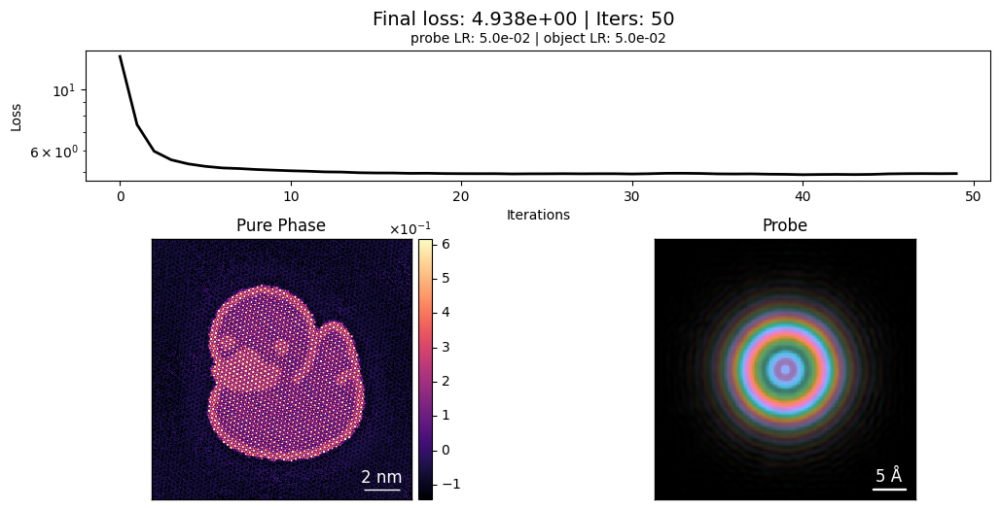

In [11]:
opt_params = {
    "object": OptimizerParams.Adam(lr=5e-2),
    "probe": OptimizerParams.Adam(lr=5e-2),
}

scheduler_params = {
    "object": SchedulerParams.Plateau(factor=0.1),
    "probe": SchedulerParams.Plateau(factor=0.1),
}

ptycho_pix.reconstruct(
    num_iters=50,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    batch_size=125,
    device="gpu",
).visualize()

In [12]:
### To view TensorBoard logs, uncomment and run:
# %load_ext tensorboard
# %tensorboard --logdir=./logs/ --port=6007 # Port 6007 avoids occasional conflicts with 6006.
# print(f"TensorBoard will be available at: http://localhost:6007")


(<Figure size 1200x400 with 3 Axes>,
 array([<Axes: title={'center': 'pixelated pure_phase | 50 iters'}>,
        <Axes: title={'center': 'zoom region 1'}>,
        <Axes: title={'center': 'zoom region 2'}>], dtype=object))

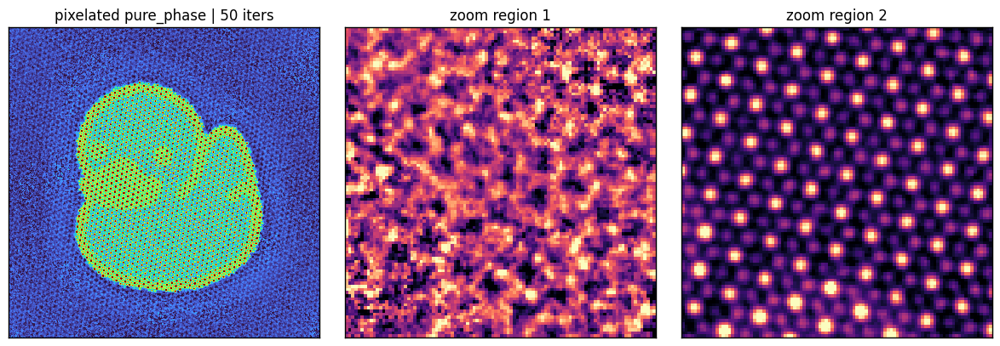

In [13]:
r1 = slice(10, 110), slice(10, 110)
r2 = slice(220, 320), slice(220, 320)
ph = ptycho_pix.obj_cropped.sum(0)
if ptycho_pix.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"pixelated {ptycho_pix.obj_model.obj_type} | {ptycho_pix.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)

You can continue reconstruction from the current state, optionally with updated optimizer settings.
Setting an optimizer type to `"none"` is a convenient way to freeze that module during later iterations.

## Implicit neural representation (INR)

An implicit object model represents the sample as a small neural network (an `HSiren`) mapping
continuous coordinates `(z, y, x)` to the object's phase, instead of a pixel grid. Because the
object is queried directly at each (fractional) scan position, the probe is no longer
subpixel-shifted; the 3D coordinate input is also a natural bridge to ptychographic tomography.

`ObjectINR` is a drop-in object model -- swap it into `from_models` and the dataset automatically
switches to coordinate queries (`dset.implicit_object`). Like the DIP, it benefits from being
**pretrained against the pixelated reconstruction** (`from_pixelated` + `pretrain`) so the main
optimization starts from a good initialization rather than vacuum. INRs are also more sensitive to
settings than DIPs: `first_omega_0` / `hidden_omega_0` (the SIREN frequency scale), the object
learning rate, and a learning-rate **scheduler** are the knobs that matter for convergence. Lower
`omega_0` (~5-10) suits smooth phase objects; the INR currently supports `obj_type="pure_phase"`.

Iter 5/5, Loss: 5.363e+00: 100%|██████████| 5/5 [00:06<00:00,  1.27s/it]


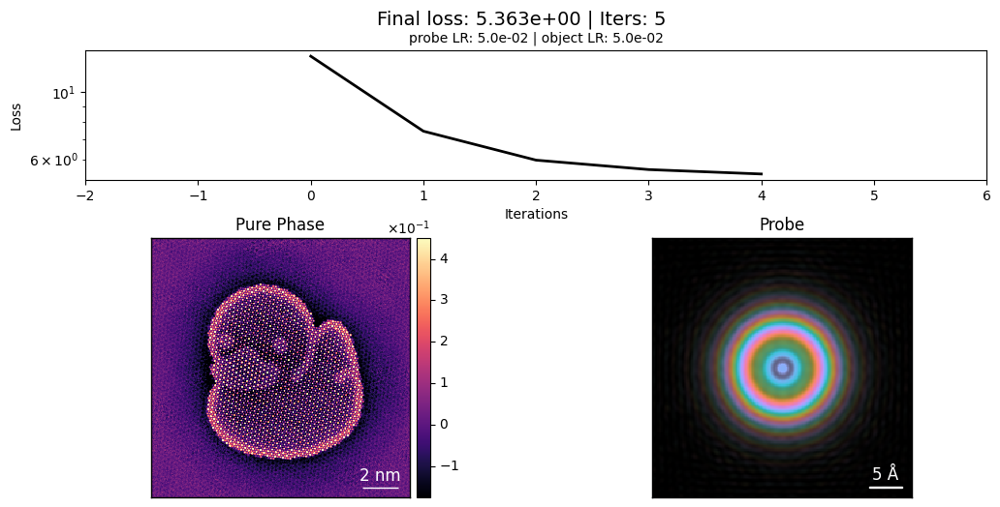

In [14]:
ptycho_pix2 = Ptychography.from_ptychography(
    ptycho=ptycho_pix,
)
ptycho_pix2.reconstruct(
    num_iters=5,
    reset=True,
    # device='gpu', 
).visualize()

  0%|          | 0/300 [00:00<?, ?it/s]

Iter 300/300, Loss: 4.327e-04: 100%|██████████| 300/300 [00:12<00:00, 24.65it/s]


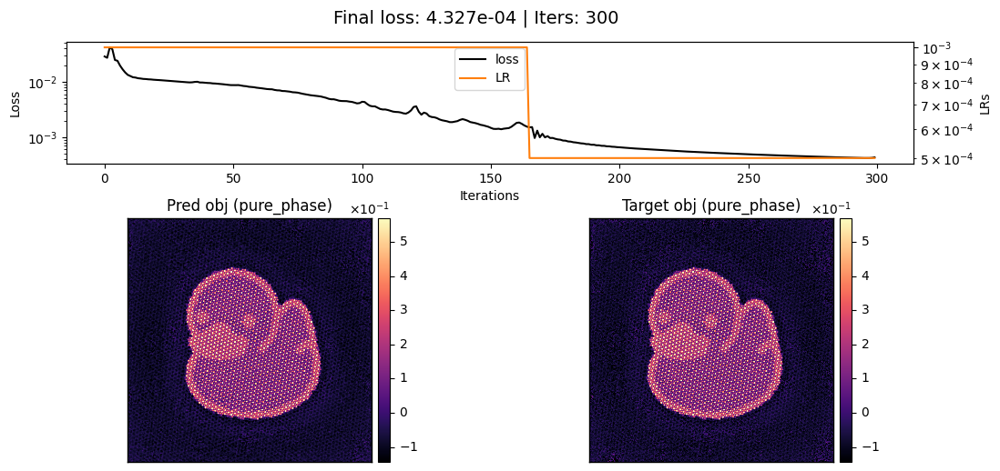

implicit object: True


In [15]:
# Build the INR from the pixelated reconstruction, with that object as the pretrain target.
# Start omega_0 LOW (coarse); we raise it later for a coarse-to-fine refinement (set_omega_0).
obj_model_inr = ObjectINR.from_pixelated(
    pixelated=ptycho_pix.obj_model,
    first_omega_0=20,  # SIREN frequency scale -- start low (coarse), raise in stage 2
    hidden_omega_0=20,
    hidden_features=256,
)

# Warm-start the PROBE from the *converged* pixelated probe (like the DIP does), instead of a
# fresh from_params probe -- otherwise the pretrained object has to fight an unrefined probe.
probe_model_inr = ProbePixelated.from_array(
    probe_array=ptycho_pix.probe,
    num_probes=1,
    probe_params=probe_params,
)

# Warm-start the INR object to reproduce the pixelated object (a scheduler helps).
obj_model_inr.pretrain(
    num_iters=300,
    optimizer_params=OptimizerParams.Adam(lr=1e-3),
    scheduler_params=SchedulerParams.Plateau(factor=0.5),
    device=config.get("device"),
)

ptycho_inr = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_inr,
    probe_model=probe_model_inr,
    detector_model=detector_model,
    device=config.get("device"),
    rng=42,
)

ptycho_inr.preprocess(
    obj_padding_px=(32, 32),
)
# With an implicit object the dataset switches to coordinate queries automatically:
print("implicit object:", ptycho_inr.dset.implicit_object)

### Levers to test for INR convergence

- **Probe warm-start** (above): start from `ptycho_pix.probe`, not a fresh probe.
- **Batch size**: the INR is a *global* model, so larger batches give lower-variance gradients (was 32 → try 125+).
- **Object LR + scheduler**: the INR gets no analytic-gradient rescaling, so it wants a higher LR than the pixelated object; pair it with `SchedulerParams.CosineAnnealing()` (anneals over `num_iters`) — Plateau is too passive. Optionally `SchedulerParams.Linear(...)` for a warmup stage.
- **Coarse-to-fine `omega_0`**: train at low `omega_0`, then `obj_model.set_omega_0(...)` higher to add detail (stage 2 below).
- **Soft-L1 data loss**: `reconstruct(loss_type="huber_amplitude", huber_delta=...)` — smooth/robust, useful if noisy.

Iter 100/100, Loss: 4.526e+00: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


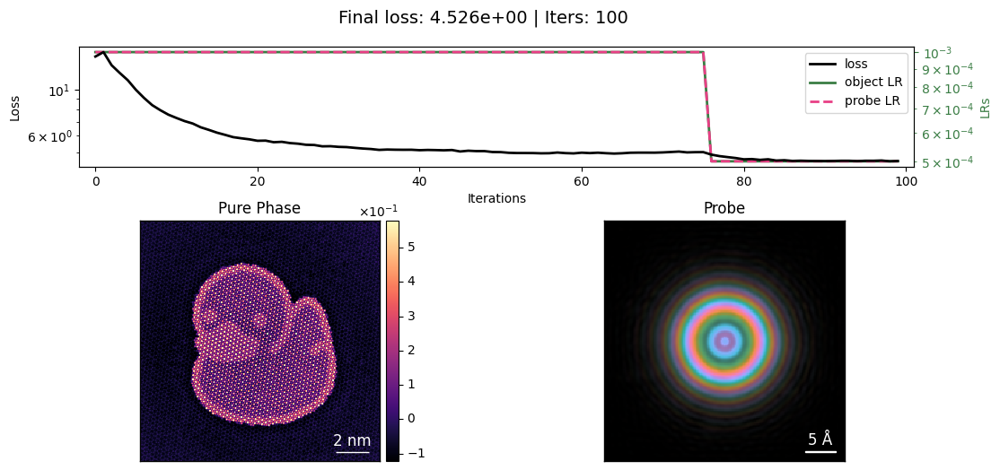

In [16]:
# Stage 1 (coarse): bigger batch + higher object LR with cosine annealing (vs the old
# batch=32 / lr=1e-3 / Plateau). CosineAnnealing() anneals over num_iters automatically.
NUM_ITERS = 100
opt_params = {
    "object": OptimizerParams.Adam(lr=1e-3),  # INR wants a higher LR than the pixelated object
    "probe": OptimizerParams.Adam(lr=1e-3),
}
scheduler_params = {
    "object": SchedulerParams.Plateau(),
    "probe": SchedulerParams.Plateau(),
}
ptycho_inr.reconstruct(
    num_iters=NUM_ITERS,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    batch_size=125,  # was 32 -- larger batch = lower-variance gradient for the global INR
    device=[0, 1, 2, 3],
    # loss_type="huber_amplitude", huber_delta=1.0,  # soft-L1 data loss; try if the data is noisy
).visualize()

Iter 100/100, Loss: 4.458e+00: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


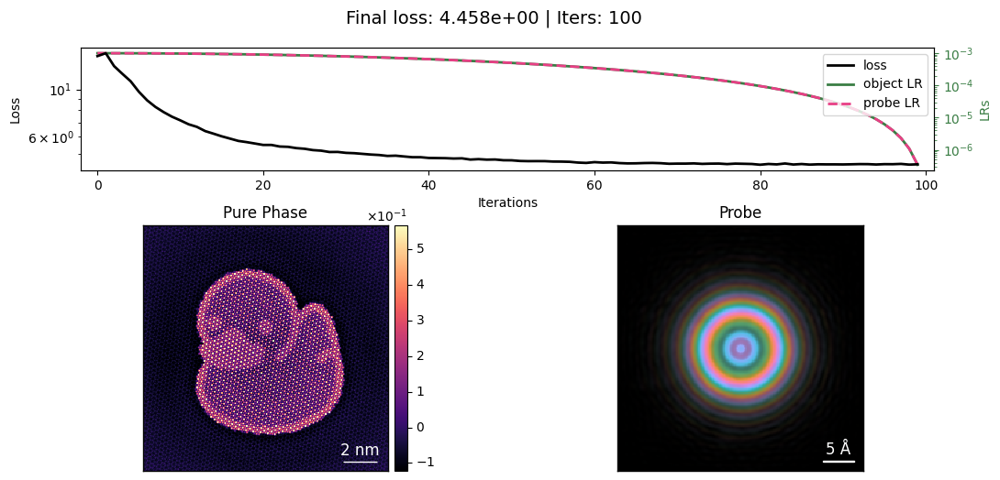

In [ ]:
# Stage 1 (coarse): bigger batch + higher object LR with cosine annealing (vs the old
# batch=32 / lr=1e-3 / Plateau). CosineAnnealing() anneals over num_iters automatically.
NUM_ITERS = 100
opt_params = {
    "object": OptimizerParams.Adam(lr=1e-3),  # INR wants a higher LR than the pixelated object
    "probe": OptimizerParams.Adam(lr=1e-3),
}
scheduler_params = {
    "object": SchedulerParams.Plateau(),
    "probe": SchedulerParams.Plateau(),
}
ptycho_inr.reconstruct(
    num_iters=NUM_ITERS,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    batch_size=125,  # was 32 -- larger batch = lower-variance gradient for the global INR
    device=[0, 1, 2, 3],
    # loss_type="huber_amplitude", huber_delta=1.0,  # soft-L1 data loss; try if the data is noisy
).visualize()

Iter 100/100, Loss: 4.532e+00: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


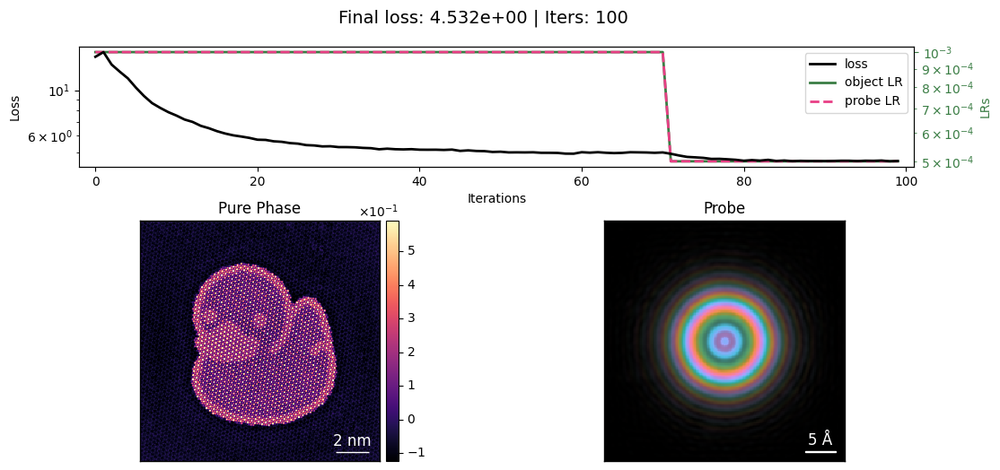

In [26]:
# Stage 1 (coarse): bigger batch + higher object LR with cosine annealing (vs the old
# batch=32 / lr=1e-3 / Plateau). CosineAnnealing() anneals over num_iters automatically.
NUM_ITERS = 100
opt_params = {
    "object": OptimizerParams.Adam(lr=1e-3),  # INR wants a higher LR than the pixelated object
    "probe": OptimizerParams.Adam(lr=1e-3),
}
scheduler_params = {
    "object": SchedulerParams.Plateau(),
    "probe": SchedulerParams.Plateau(),
}
ptycho_inr.reconstruct(
    num_iters=NUM_ITERS,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    batch_size=125,  # was 32 -- larger batch = lower-variance gradient for the global INR
    device=[0, 1, 2, 3],
    # loss_type="huber_amplitude", huber_delta=1.0,  # soft-L1 data loss; try if the data is noisy
).visualize()

Recon MSE: 1.643e-03


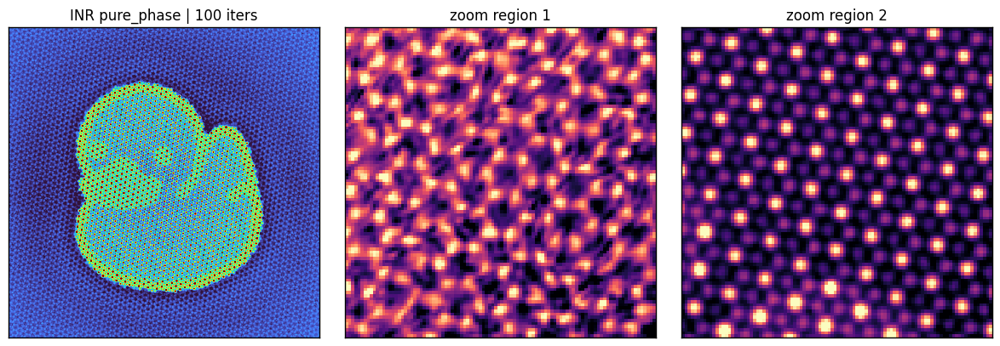

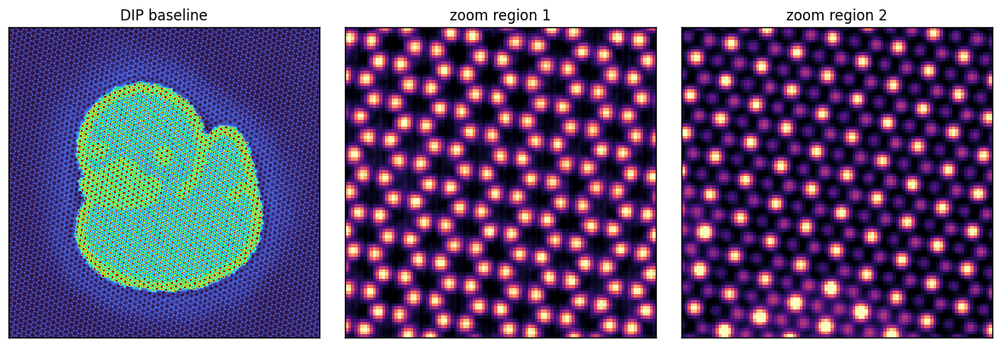

In [21]:
ph = ptycho_inr.obj_cropped.sum(0)
if ptycho_inr.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"INR {ptycho_inr.obj_model.obj_type} | {ptycho_inr.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)

ph_target = good_recon.sum(0)
show_2d(
    [
        ph_target,
        ph_target[r1],
        ph_target[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        "DIP baseline",
        "zoom region 1",
        "zoom region 2",
    ],
)

recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon)**2)
print(f"Recon MSE: {recon_mse:.3e}")

Recon MSE: 8.555e-04


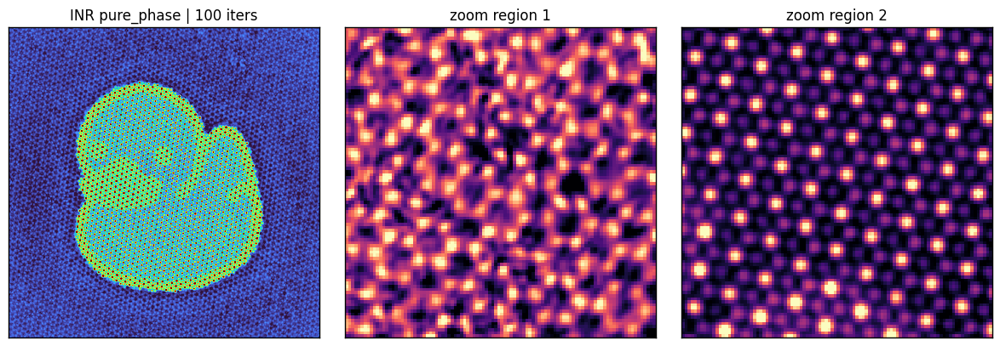

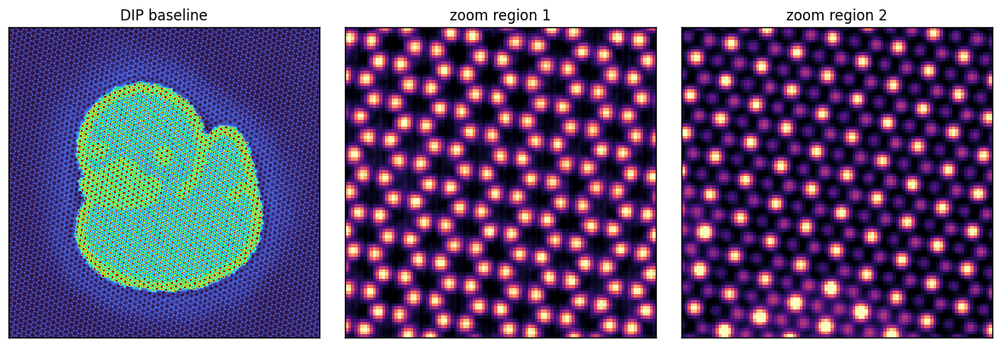

In [27]:
ph = ptycho_inr.obj_cropped.sum(0)
if ptycho_inr.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"INR {ptycho_inr.obj_model.obj_type} | {ptycho_inr.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)

ph_target = good_recon.sum(0)
show_2d(
    [
        ph_target,
        ph_target[r1],
        ph_target[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        "DIP baseline",
        "zoom region 1",
        "zoom region 2",
    ],
)

recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon)**2)
print(f"Recon MSE: {recon_mse:.3e}")

Iter 100/100, Loss: 5.360e+00: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


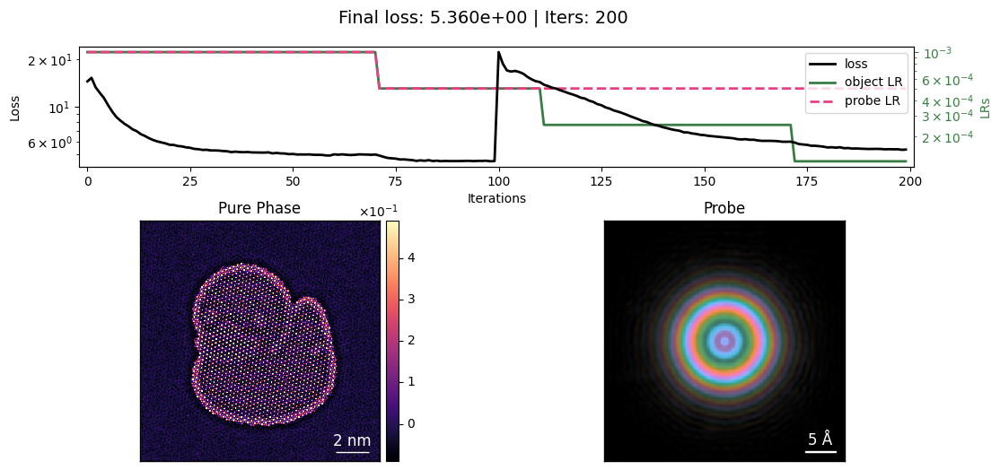

Stage-2 (omega_0=25) Recon MSE: 1.014e-02


(<Figure size 1200x400 with 3 Axes>,
 array([<Axes: title={'center': 'INR coarse-to-fine | 200 iters'}>,
        <Axes: title={'center': 'zoom 1'}>,
        <Axes: title={'center': 'zoom 2'}>], dtype=object))

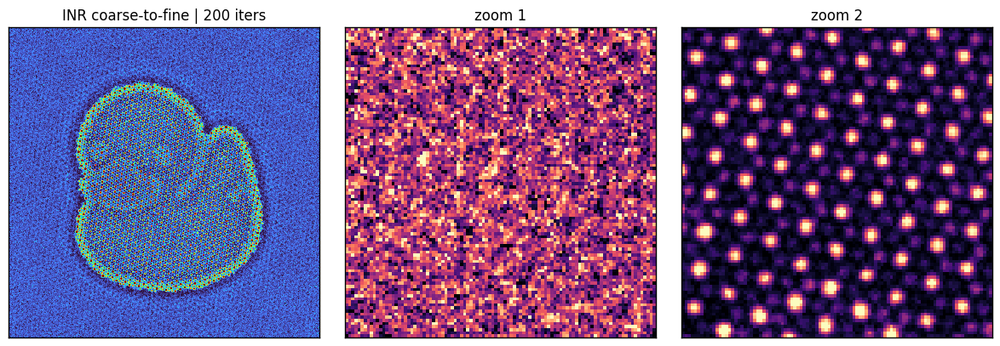

In [28]:
# Stage 2 (fine): coarse-to-fine -- raise omega_0 to add high-frequency detail, then keep going
# (no reset, so it continues from stage 1). set_omega_0 retunes the SIREN in place (keeps weights).
NUM_ITERS_FINE = 100
ptycho_inr.obj_model.set_omega_0(first_omega_0=40, hidden_omega_0=40)
ptycho_inr.reconstruct(
    num_iters=NUM_ITERS_FINE,
).visualize()

ph = ptycho_inr.obj_cropped.sum(0)
recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon) ** 2)
print(f"Stage-2 (omega_0=25) Recon MSE: {recon_mse:.3e}")
show_2d(
    [ph, ph[r1], ph[r2]],
    cmap=("turbo", "magma", "magma"),
    title=[f"INR coarse-to-fine | {ptycho_inr.num_iters} iters", "zoom 1", "zoom 2"],
)

Recon MSE: 1.014e-02


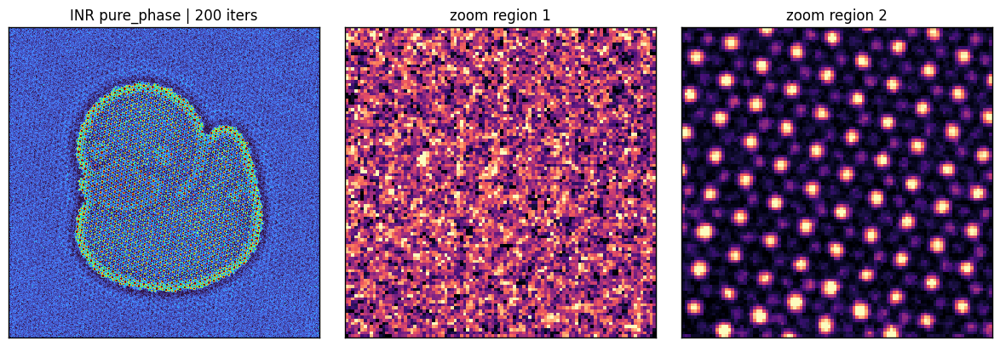

In [29]:
ph = ptycho_inr.obj_cropped.sum(0)
if ptycho_inr.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"INR {ptycho_inr.obj_model.obj_type} | {ptycho_inr.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)
recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon)**2)
print(f"Recon MSE: {recon_mse:.3e}")


Iter 50/50, Loss: 1.183e+01: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]


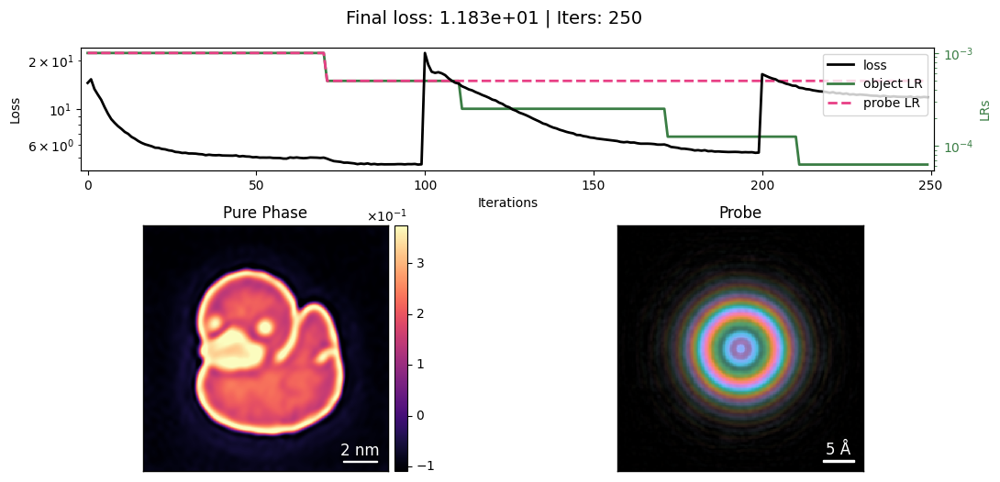

Stage-2 (omega_0=25) Recon MSE: 1.316e-02


(<Figure size 1200x400 with 3 Axes>,
 array([<Axes: title={'center': 'INR coarse-to-fine | 250 iters'}>,
        <Axes: title={'center': 'zoom 1'}>,
        <Axes: title={'center': 'zoom 2'}>], dtype=object))

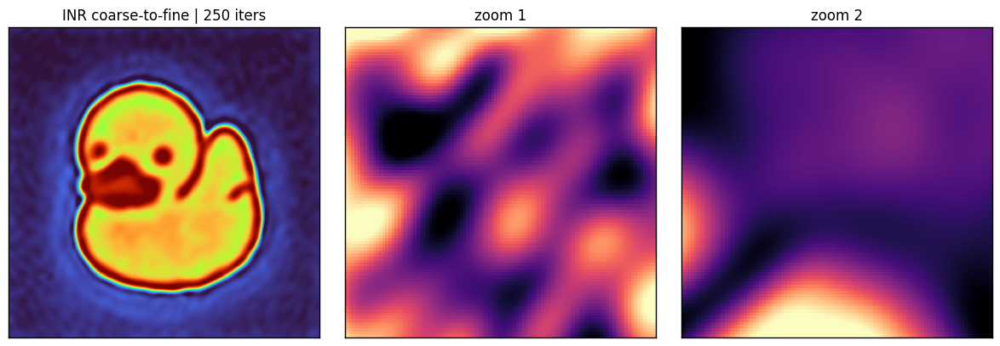

In [30]:
# Stage 2 (fine): coarse-to-fine -- raise omega_0 to add high-frequency detail, then keep going
# (no reset, so it continues from stage 1). set_omega_0 retunes the SIREN in place (keeps weights).
NUM_ITERS_FINE = 50
ptycho_inr.obj_model.set_omega_0(first_omega_0=10, hidden_omega_0=10)
ptycho_inr.reconstruct(
    num_iters=NUM_ITERS_FINE,
).visualize()

ph = ptycho_inr.obj_cropped.sum(0)
recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon) ** 2)
print(f"Stage-2 (omega_0=25) Recon MSE: {recon_mse:.3e}")
show_2d(
    [ph, ph[r1], ph[r2]],
    cmap=("turbo", "magma", "magma"),
    title=[f"INR coarse-to-fine | {ptycho_inr.num_iters} iters", "zoom 1", "zoom 2"],
)

Recon MSE: 1.316e-02


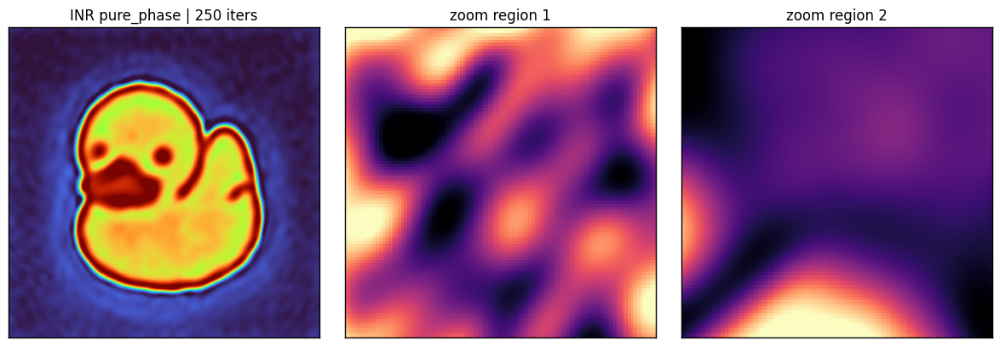

In [31]:
ph = ptycho_inr.obj_cropped.sum(0)
if ptycho_inr.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"INR {ptycho_inr.obj_model.obj_type} | {ptycho_inr.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)
recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon)**2)
print(f"Recon MSE: {recon_mse:.3e}")


Iter 300/300, Loss: 2.363e-04: 100%|██████████| 300/300 [00:12<00:00, 24.72it/s]


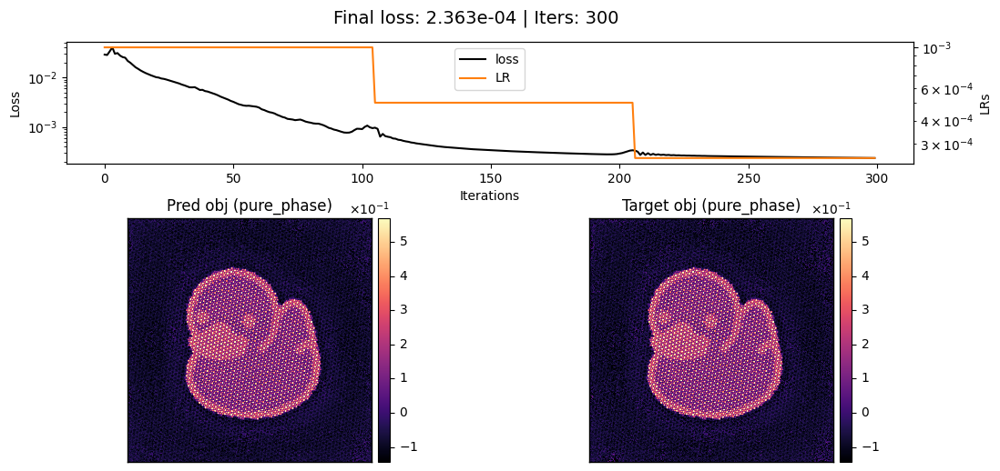

implicit object: True


In [22]:
# Build the INR from the pixelated reconstruction, with that object as the pretrain target.
# Start omega_0 LOW (coarse); we raise it later for a coarse-to-fine refinement (set_omega_0).
obj_model_inr = ObjectINR.from_pixelated(
    pixelated=ptycho_pix.obj_model,
    first_omega_0=40,  # SIREN frequency scale -- start low (coarse), raise in stage 2
    hidden_omega_0=40,
    hidden_features=256,
)

# Warm-start the PROBE from the *converged* pixelated probe (like the DIP does), instead of a
# fresh from_params probe -- otherwise the pretrained object has to fight an unrefined probe.
probe_model_inr = ProbePixelated.from_array(
    probe_array=ptycho_pix.probe,
    num_probes=1,
    probe_params=probe_params,
)

# Warm-start the INR object to reproduce the pixelated object (a scheduler helps).
obj_model_inr.pretrain(
    num_iters=300,
    optimizer_params=OptimizerParams.Adam(lr=1e-3),
    scheduler_params=SchedulerParams.Plateau(factor=0.5),
    device=config.get("device"),
)

ptycho_inr = Ptychography.from_models(
    dset=pdset,
    obj_model=obj_model_inr,
    probe_model=probe_model_inr,
    detector_model=detector_model,
    device=config.get("device"),
    rng=42,
)

ptycho_inr.preprocess(
    obj_padding_px=(32, 32),
)
# With an implicit object the dataset switches to coordinate queries automatically:
print("implicit object:", ptycho_inr.dset.implicit_object)

Iter 100/100, Loss: 4.452e+00: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


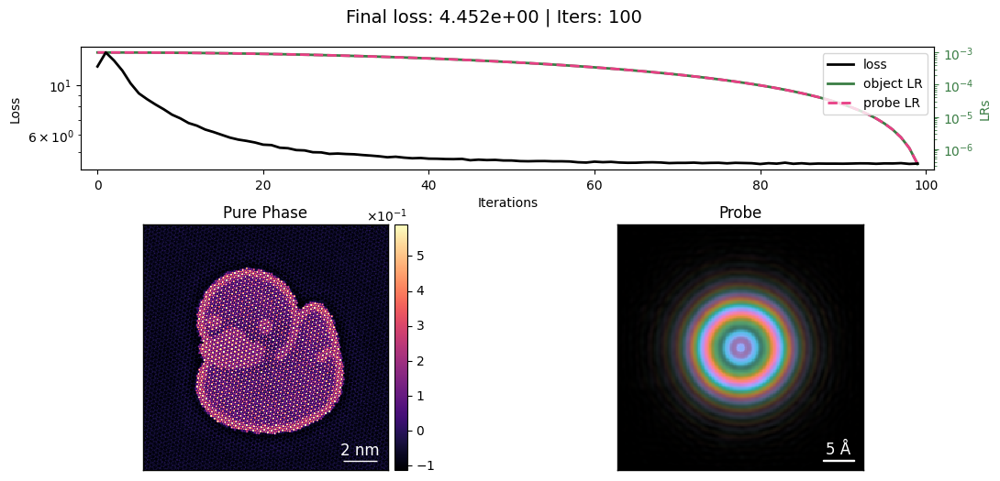

In [23]:
# Stage 1 (coarse): bigger batch + higher object LR with cosine annealing (vs the old
# batch=32 / lr=1e-3 / Plateau). CosineAnnealing() anneals over num_iters automatically.
NUM_ITERS = 100
opt_params = {
    "object": OptimizerParams.Adam(lr=1e-3),  # INR wants a higher LR than the pixelated object
    "probe": OptimizerParams.Adam(lr=1e-3),
}
scheduler_params = {
    "object": SchedulerParams.CosineAnnealing(),
    "probe": SchedulerParams.CosineAnnealing(),
}
ptycho_inr.reconstruct(
    num_iters=NUM_ITERS,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    batch_size=125, 
    device=[0, 1, 2, 3],
    # loss_type="huber_amplitude", huber_delta=1.0,  # soft-L1 data loss; try if the data is noisy
).visualize()

Recon MSE: 9.328e-04


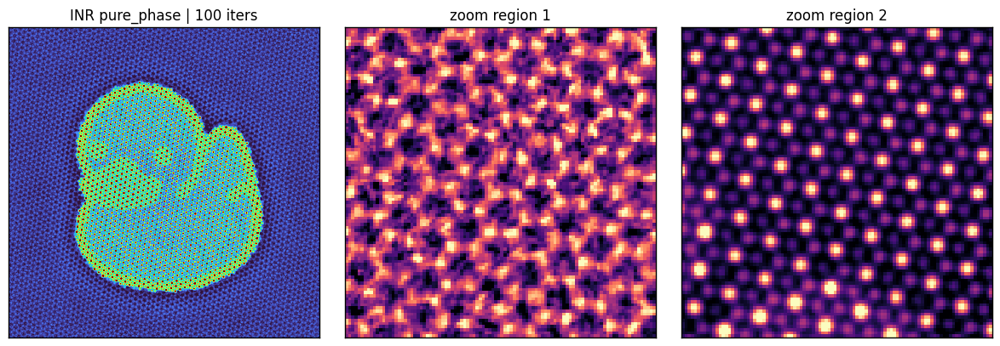

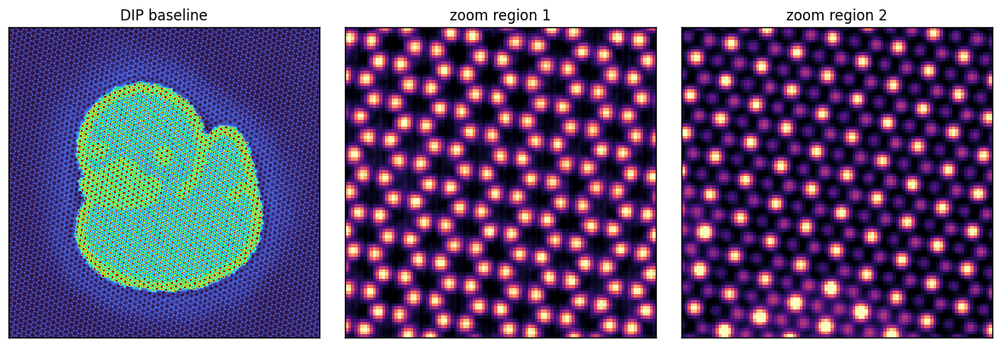

In [24]:
ph = ptycho_inr.obj_cropped.sum(0)
if ptycho_inr.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"INR {ptycho_inr.obj_model.obj_type} | {ptycho_inr.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)

ph_target = good_recon.sum(0)
show_2d(
    [
        ph_target,
        ph_target[r1],
        ph_target[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        "DIP baseline",
        "zoom region 1",
        "zoom region 2",
    ],
)

recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon)**2)
print(f"Recon MSE: {recon_mse:.3e}")

Iter 100/100, Loss: 1.285e+01: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


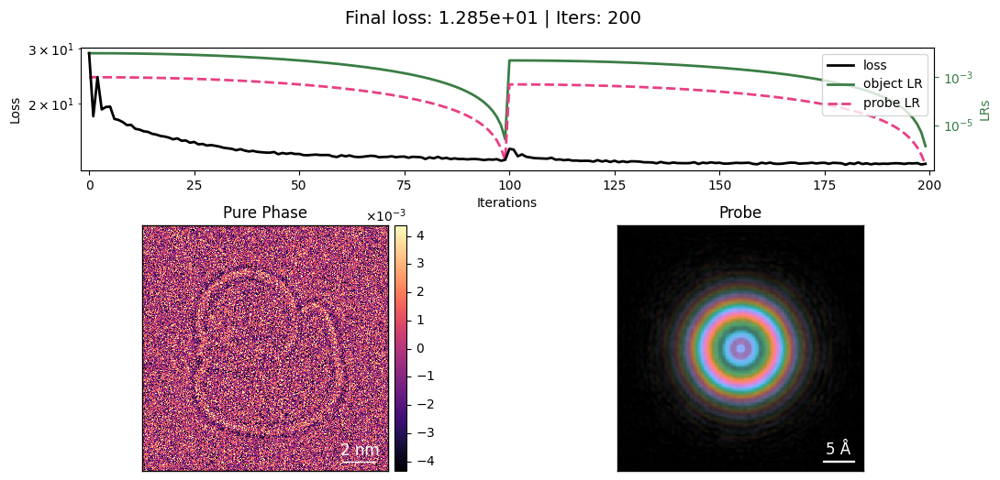

Stage-2 (omega_0=25) Recon MSE: 3.373e-02


(<Figure size 1200x400 with 3 Axes>,
 array([<Axes: title={'center': 'INR coarse-to-fine | 200 iters'}>,
        <Axes: title={'center': 'zoom 1'}>,
        <Axes: title={'center': 'zoom 2'}>], dtype=object))

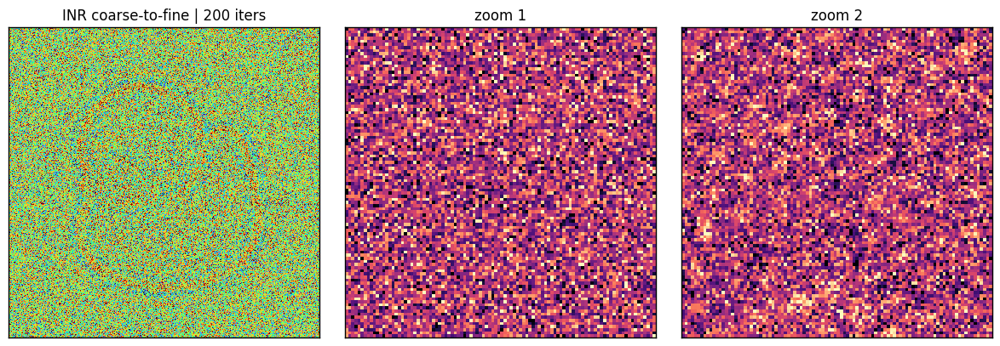

In [18]:
# Stage 2 (fine): coarse-to-fine -- raise omega_0 to add high-frequency detail, then keep going
# (no reset, so it continues from stage 1). set_omega_0 retunes the SIREN in place (keeps weights).
NUM_ITERS_FINE = 100
ptycho_inr.obj_model.set_omega_0(first_omega_0=25, hidden_omega_0=25)
ptycho_inr.reconstruct(
    num_iters=NUM_ITERS_FINE,
    optimizer_params={
        "object": OptimizerParams.Adam(lr=5e-3),
        "probe": OptimizerParams.Adam(lr=5e-4),
    },
    scheduler_params={
        "object": SchedulerParams.CosineAnnealing(),
        "probe": SchedulerParams.CosineAnnealing(),
    },
    batch_size=125,
    device=[0, 1, 2, 3],
).visualize()

ph = ptycho_inr.obj_cropped.sum(0)
recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon) ** 2)
print(f"Stage-2 (omega_0=25) Recon MSE: {recon_mse:.3e}")
show_2d(
    [ph, ph[r1], ph[r2]],
    cmap=("turbo", "magma", "magma"),
    title=[f"INR coarse-to-fine | {ptycho_inr.num_iters} iters", "zoom 1", "zoom 2"],
)

Iter 75/75, Loss: 5.107e+00: 100%|██████████| 75/75 [01:09<00:00,  1.08it/s]


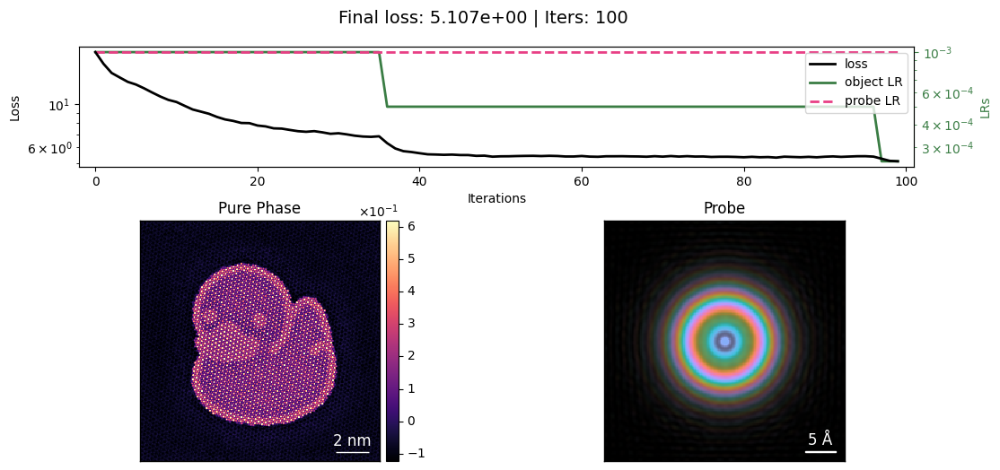

In [19]:
ptycho_inr.reconstruct(
    num_iters=75,
).visualize()

Recon MSE: 6.724e-04


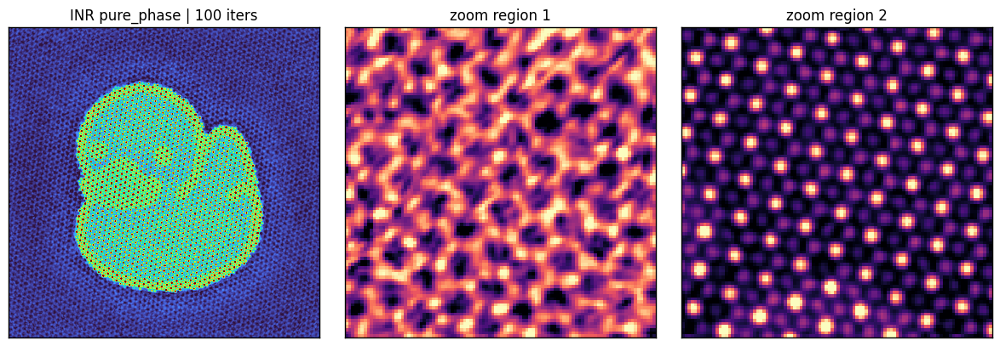

In [20]:
ph = ptycho_inr.obj_cropped.sum(0)
if ptycho_inr.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"INR {ptycho_inr.obj_model.obj_type} | {ptycho_inr.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)

recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon)**2)
print(f"Recon MSE: {recon_mse:.3e}")

Recon MSE: 6.724e-04


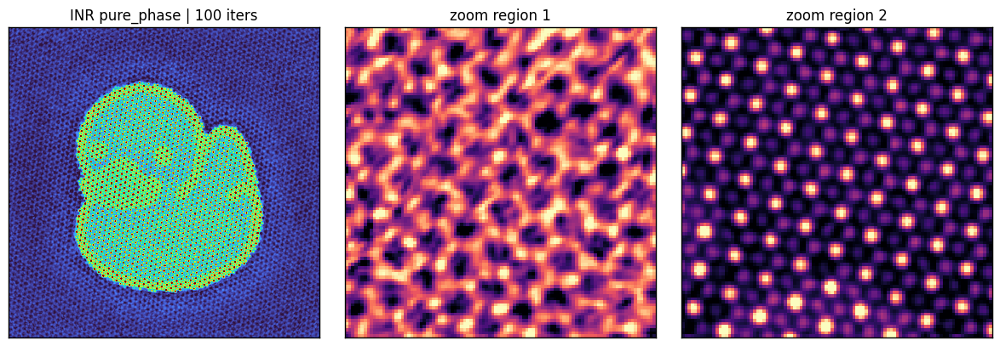

In [21]:
ph = ptycho_inr.obj_cropped.sum(0)
if ptycho_inr.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"INR {ptycho_inr.obj_model.obj_type} | {ptycho_inr.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)

recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon)**2)
print(f"Recon MSE: {recon_mse:.3e}")

Iter 100/100, Loss: 4.784e+00: 100%|██████████| 100/100 [01:32<00:00,  1.08it/s]


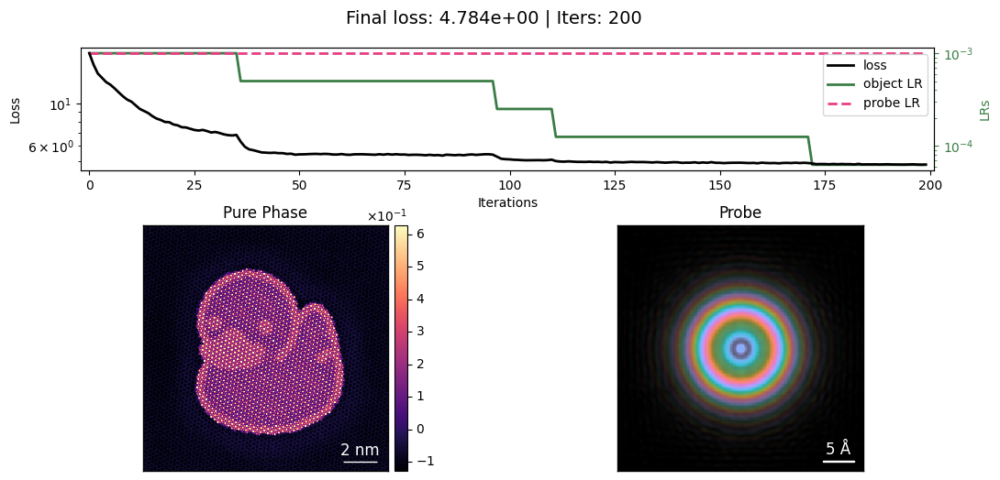

In [22]:
ptycho_inr.reconstruct(
    num_iters=100,
).visualize()

Recon MSE: 4.324e-04


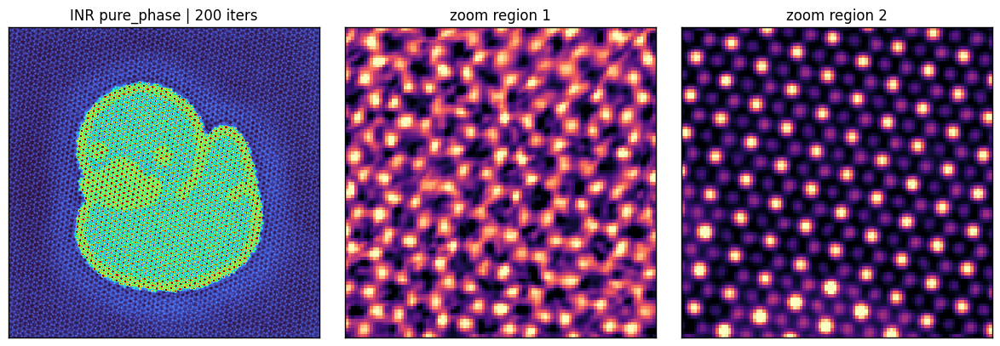

In [23]:
ph = ptycho_inr.obj_cropped.sum(0)
if ptycho_inr.obj_model.obj_type == "complex":
    ph = np.angle(ph)
show_2d(
    [
        ph,
        ph[r1],
        ph[r2],
    ],
    cmap=("turbo", "magma", "magma"),
    title=[
        f"INR {ptycho_inr.obj_model.obj_type} | {ptycho_inr.num_iters} iters",
        "zoom region 1",
        "zoom region 2",
    ],
)

recon_mse = np.mean((ptycho_inr.obj_cropped - good_recon)**2)
print(f"Recon MSE: {recon_mse:.3e}")